# Generative Models


In [3]:
from utils.plotting import plot_tsne
from pathlib import Path
import tqdm


In [ ]:
# Using Paperspace
content_path = "/notebooks"
data_path = "./data/"

content_path = Path(content_path)


# Variational Autoencoder

MNIST dataset


In [5]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt


def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


if not os.path.exists(content_path / "M_VAE/"):
    os.makedirs(content_path / "M_VAE/")

if not os.path.exists(data_path):
    os.makedirs(data_path)

if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True
if GPU:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f"Using {device}")


Using cuda


### Hyper-parameters


In [140]:
num_epochs = 15
learning_rate = 2e-3
batch_size = 128
latent_dim = 30
beta = 4

transform = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)


def denorm(x):
    return x


### Data loading


In [ ]:
train_dat = datasets.MNIST(data_path, train=True, download=True, transform=transform)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path / "M_VAE/image_original.png")


### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


In [142]:
class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            # b, 1, 28, 28
            nn.Conv2d(1, 8, 3, stride=2, padding=1),
            # b, 8, 14, 14
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.Conv2d(8, 32, 3, stride=2, padding=1),
            # b, 32, 7, 7
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            # b, 64, 4, 4
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            # b, 128, 2, 2
            nn.BatchNorm2d(128),
            nn.ReLU(True),
        )

        # flatten to 128*2*2 = 512
        self.fc1_mu = nn.Linear(512, latent_dim)
        self.fc1_logvar = nn.Linear(512, latent_dim)
        self.fc2 = nn.Linear(latent_dim, 512)

        # reshape to (b, 128, 2, 2)
        self.decoder = nn.Sequential(
            # b, 128, 2, 2
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),
            # b, 64, 4, 4
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1),
            # b, 32, 7, 7
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 8, 4, stride=2, padding=1),
            # b, 8, 14, 14
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 4, stride=2, padding=1),
            # b, 1, 28, 28
            nn.Sigmoid(),
        )

    def encode(self, x):
        x = self.encoder(x)
        x = x.view(x.shape[0], -1)

        # Get mu and logvar
        mu = self.fc1_mu(x)
        logvar = self.fc1_logvar(x)
        return mu, logvar

    def reparametrize(self, mu, logvar):
        if self.training:
            mean = torch.zeros_like(mu)
            std = torch.ones_like(mu)
            eps = torch.normal(mean=mean, std=std)

            return mu + torch.exp(logvar / 2) * eps
        else:
            return mu

    def decode(self, z):
        z = self.fc2(z)
        # Reshape to fit into decoder
        z = z.view(z.shape[0], 128, 2, 2)
        z = self.decoder(z)
        return z

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        return self.decode(z), mu, logvar


model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)


Total number of parameters is: 295717
VAE(
  (encoder): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(8, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
  )
  (fc1_mu): Linear(in_features=512, out_features=30, bias=True)
  (fc1_logvar): Linear(in_features=512, out_features=30, bias=True)
  (fc2): Linear(in_features=

### Loss

Beta VAE loss, with encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D*{K L}[q*\phi(z \mid X) \| p\_\theta(z)]$$


In [143]:
def loss_function_VAE(recon_x, x, mu, logvar, beta):
    NLL = F.binary_cross_entropy(recon_x, x, reduction="sum")
    KL = beta * 0.5 * torch.sum(torch.exp(logvar) + torch.square(mu) - 1 - logvar)

    return NLL, KL, NLL + KL


scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=12, gamma=0.3)
train_losses = []
test_losses = []

for epoch in range(num_epochs):
    model.train()
    loss_total = nll_loss_total = kl_loss_total = 0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch:
        for batch_idx, (data, _) in enumerate(tepoch):
            data = data.to(device)

            optimizer.zero_grad()
            recon_x, mu, logvar = model(data)

            nll_loss, kl_loss, loss = loss_function_VAE(recon_x, data, mu, logvar, beta)
            loss_total += loss.item()
            nll_loss_total += nll_loss.item()
            kl_loss_total += kl_loss.item()

            loss.backward()
            optimizer.step()

            if batch_idx % 20 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(loss=loss.item() / len(data))

    train_losses.append(
        (
            loss_total / len(loader_train.dataset),
            nll_loss_total / len(loader_train.dataset),
            kl_loss_total / len(loader_train.dataset),
        )
    )

    model.eval()
    loss_total = nll_loss_total = kl_loss_total = 0
    with torch.no_grad():
        with tqdm.tqdm(loader_test, unit="batch") as tepoch:
            for batch_idx, (data, y) in enumerate(tepoch):
                data = data.to(device=device)
                y = y.to(device=device)
                recon_x, mu, logvar = model(data)

                nll_loss, kl_loss, loss = loss_function_VAE(recon_x, data, mu, logvar, beta)
                loss_total += loss.item()
                nll_loss_total += nll_loss.item()
                kl_loss_total += kl_loss.item()

    test_losses.append(
        (
            loss_total / len(loader_test.dataset),
            nll_loss_total / len(loader_test.dataset),
            kl_loss_total / len(loader_test.dataset),
        )
    )

    scheduler.step()

    # save the model
    if epoch == num_epochs - 1:
        with torch.no_grad():
            torch.jit.save(torch.jit.trace(model, (data), check_trace=False), content_path / "M_VAE/VAE_model.pth")


100%|██████████| 79/79 [00:00<00:00, 120.36batch/s]


### Loss curve


Text(0.5, 1.0, 'Train and test loss curves (beta = 4)')

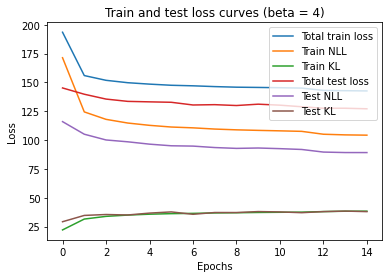

In [161]:
for loss in list(zip(*train_losses)):
    plt.plot(loss)

for loss in list(zip(*test_losses)):
    plt.plot(loss)

plt.legend(["Total train loss", "Train NLL", "Train KL", "Total test loss", "Test NLL", "Test KL"])
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title(f"Train and test loss curves (beta = {beta})")


### Reconstructions


Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


/usr/local/lib/python3.9/dist-packages/torchvision/utils.py:68: UserWarning: The parameter 'range' is deprecated since 0.12 and will be removed in 0.14. Please use 'value_range' instead.
  warnings.warn(


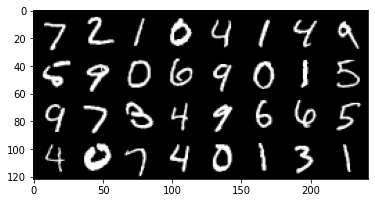

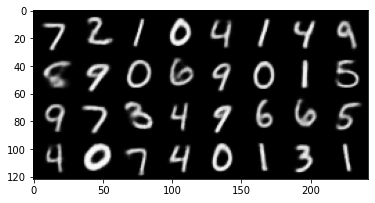

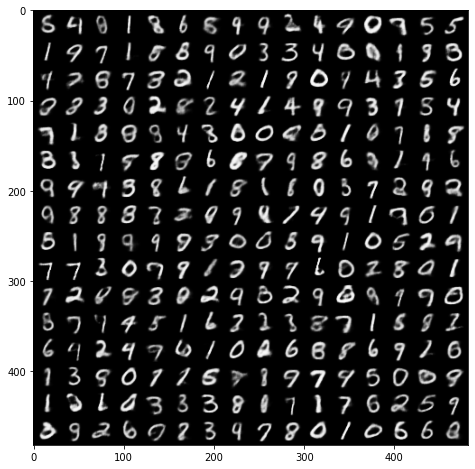

In [162]:
print("Input images")
print("-" * 50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize some original images
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False, range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print("Reconstructed images")
print("-" * 50)
with torch.no_grad():
    fixed_input = fixed_input.to(device)
    recon_batch, _, _ = model(fixed_input)
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(
        denorm(recon_batch), nrow=8, padding=2, normalize=False, range=None, scale_each=False, pad_value=0
    )
    plt.figure()
    show(recon_batch)

print("Generated Images")
print("-" * 50)
model.eval()
n_samples = 256
z = torch.randn(n_samples, latent_dim).to(device)
with torch.no_grad():
    samples = model.decode(z)
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False, range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(8, 8))
    show(samples)


### T-SNE on Embeddings


In [184]:
from sklearn.manifold import TSNE

test_data_loader = DataLoader(test_dat, 10000)
with torch.no_grad():
    for data, y in test_data_loader:
        data = data.to(device=device)
        mu, logvar = model.encode(data)
        z = model.reparametrize(mu, logvar)

z = z.cpu().detach().numpy()
z_embedded = TSNE(n_components=2, perplexity=30).fit_transform(z)


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [185]:
# Interactive visualization
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


alt.HConcatChart(...)

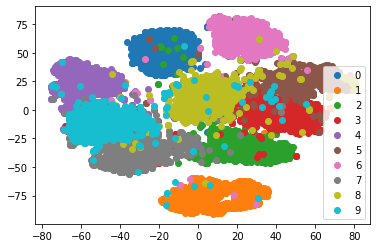

In [186]:
# Custom visualization
for number in np.unique(y.cpu().detach().numpy()):
    i = np.where(y == number)
    plt.scatter(z_embedded[i, 0], z_embedded[i, 1], label=number)
plt.legend()


### Linear interpolations


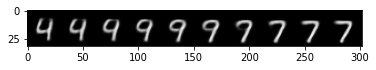

In [203]:
z_two = z[np.where(y == 4)[0][0]]
z_eight = z[np.where(y == 7)[0][0]]
steps = np.linspace(z_two, z_eight, 10)

with torch.no_grad():
    steps = torch.from_numpy(steps).to(device)
    numbers = model.decode(steps).cpu()
    image = make_grid(denorm(numbers), nrow=10)
    plt.figure()
    show(image)


# Deep Convolutional GAN

CIFAR-10 dataset


In [214]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())


def denorm(x, channels=None, w=None, h=None, resize=False):
    # unnormalize(x)
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print("Number of channels, width and height must be provided for resize.")
        x = x.view(x.size(0), channels, w, h)
    return x


def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


if not os.path.exists(content_path / "M_GAN"):
    os.makedirs(content_path / "M_GAN")

GPU = True
if GPU:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f"Using {device}")

if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)


Using cuda


#### Data loading


In [215]:
batch_size = 128

transform = transforms.Compose(
    [
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(),
        # transforms.Normalize(mean=mean, std=std),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ]
)

cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)


Files already downloaded and verified
Files already downloaded and verified


/usr/local/lib/python3.9/dist-packages/torchvision/utils.py:68: UserWarning: The parameter 'range' is deprecated since 0.12 and will be removed in 0.14. Please use 'value_range' instead.
  warnings.warn(


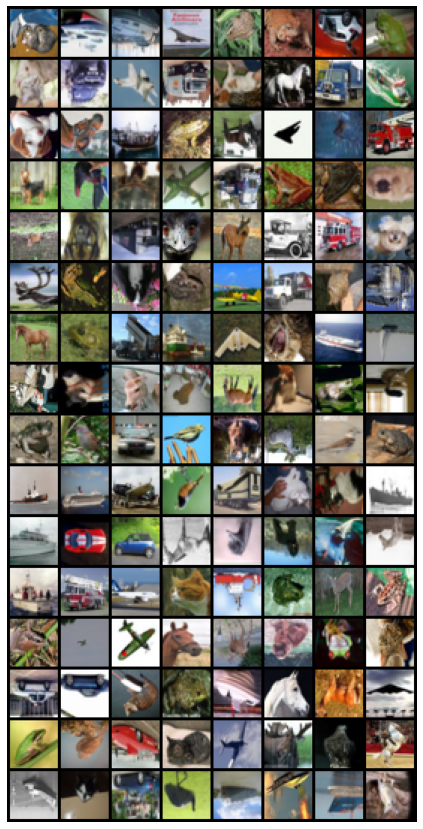

In [216]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False, range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15, 15))
plt.axis("off")
show(samples)


### Model


In [217]:
num_epochs = 50
lr_G = 1e-3
lr_G_decay = 0.982
lr_D = 5e-4
lr_D_decay = 0.971
latent_vector_size = 100

real_label = 0.9
fake_label = 0
label_swap_p = 0.05


In [218]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.g = nn.Sequential(
            # b x lvs x 1 x 1
            nn.ConvTranspose2d(latent_vector_size, 512, 4, 1, 0, bias=False),
            # b x 512 x 4 x 4
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            # b x 256 x 8 x 8
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            # b x 128 x 16 x 16
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 3, 4, 2, 1, bias=False),
            # b x 3 x 32 x 32
            nn.Tanh(),
        )

    def forward(self, z):
        return self.g(z)


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.d = nn.Sequential(
            # b x 3 x 32 x 32
            nn.Conv2d(3, 128, 4, 2, 1, bias=False),
            # b x 128 x 16 x 16
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            # b x 256 x 8 x 8
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            # b x 512 x 4 x 4
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            # b x 1 x 1 x 1
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.d(x)


In [219]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)


In [220]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print("\n")

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print("\n")

print("Total number of parameters is: {}".format(params_G + params_D))


Total number of parameters in Generator is: 3448576
Generator(
  (g): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 2637568
Discriminator(
  (d): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), 

### Loss


In [221]:
from torch.autograd import Variable


def loss_function(out, target):
    loss = F.binary_cross_entropy(out, target)
    return loss


def gp_loss(data, new_data):
    a = torch.rand(data.shape[0], 1, 1, 1)
    a = a.expand_as(data)
    a = a.to(device=device)

    interpolation = a * data.data + (1 - a) * new_data.data
    interpolation = Variable(interpolation, requires_grad=True)

    interpolation = interpolation.to(device=device)

    prob_interpolated = model_D(interpolation)
    grad_outputs = torch.ones(prob_interpolated.size())

    grad_outputs = grad_outputs.to(device=device)

    gradients = torch.autograd.grad(
        outputs=prob_interpolated, inputs=interpolation, grad_outputs=grad_outputs, create_graph=True, retain_graph=True
    )[0]

    gradients = gradients.view(data.shape[0], -1)
    gradients_norm = torch.sqrt(torch.sum(gradients**2, dim=1) + 1e-12)
    return ((gradients_norm - 1) ** 2).mean()


<h3>Choose and initialize optimizers</h3>


In [222]:
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=lr_D, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=lr_G, betas=(beta1, 0.999))

scheduler_D = torch.optim.lr_scheduler.LambdaLR(optimizerD, lr_lambda=lambda e: lr_D_decay**e)
scheduler_G = torch.optim.lr_scheduler.LambdaLR(optimizerG, lr_lambda=lambda e: lr_G_decay**e)


In [223]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)


In [224]:
train_losses_G = []
train_losses_D = []
train_gp_losses = []

for epoch in range(num_epochs):
    with tqdm.tqdm(loader_train, unit="batch") as tepoch:
        for i, data in enumerate(tepoch):
            train_loss_D = 0
            train_loss_G = 0
            train_loss_gp = 0

            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))

            # train with real

            model_D.zero_grad()
            real_cpu = data[0].to(device)
            label = torch.full((real_cpu.shape[0],), real_label, dtype=torch.float, device=device)
            flipped_label_i = np.random.choice(np.arange(label.shape[0]), size=int(label_swap_p * label.shape[0]))
            label[flipped_label_i] = 1 - label[flipped_label_i]
            # Forward pass real batch through D
            output = model_D(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = loss_function(output, label)
            # Calculate gradients for D in backward pass
            D_x = output.mean().item()

            # train with fake

            # Generate batch of latent vectors
            noise = torch.randn(real_cpu.shape[0], latent_vector_size, 1, 1, device=device)
            # Generate fake image batch with G
            fake = model_G(noise)
            label = torch.full((real_cpu.shape[0],), fake_label, dtype=torch.float, device=device)
            # Classify all fake batch with D
            output = model_D(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = loss_function(output, label)
            # Calculate the gradients for this batch, accumulated (summed) with previous gradients
            D_G_z1 = output.mean().item()

            gp = gp_loss(real_cpu.data, fake.data)

            # Compute error of D as sum over the fake and the real batches
            errD = errD_real + errD_fake + gp
            errD.backward()
            # Update D
            optimizerD.step()

            train_loss_D += errD.item()
            train_loss_gp += gp.item()

            # (2) Update G network: maximize log(D(G(z)))

            model_G.zero_grad()
            label = torch.full(
                (real_cpu.shape[0],), real_label, dtype=torch.float, device=device
            )  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = model_D(fake).view(-1)
            # Calculate G's loss based on this output
            errG = loss_function(output, label)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG.step()

            train_loss_G += errG.item()

            # Logging
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x, Loss_D=errD.item(), Loss_G=errG.item())

    scheduler_D.step()
    scheduler_G.step()

    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), content_path / "M_GAN/real_samples.png")
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), content_path / f"M_GAN/fake_samples_epoch_{epoch}.png")
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))
    train_gp_losses.append(train_loss_gp / len(loader_train))

torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path / "M_GAN/GAN_G_model.pth")
torch.jit.save(torch.jit.trace(model_D, (fake)), content_path / "M_GAN/GAN_D_model.pth")


Epoch 49: 100%|██████████| 391/391 [00:34<00:00, 11.37batch/s, D_G_z=0.227/0.192, D_x=0.564, Loss_D=0.962, Loss_G=1.61]


### Results


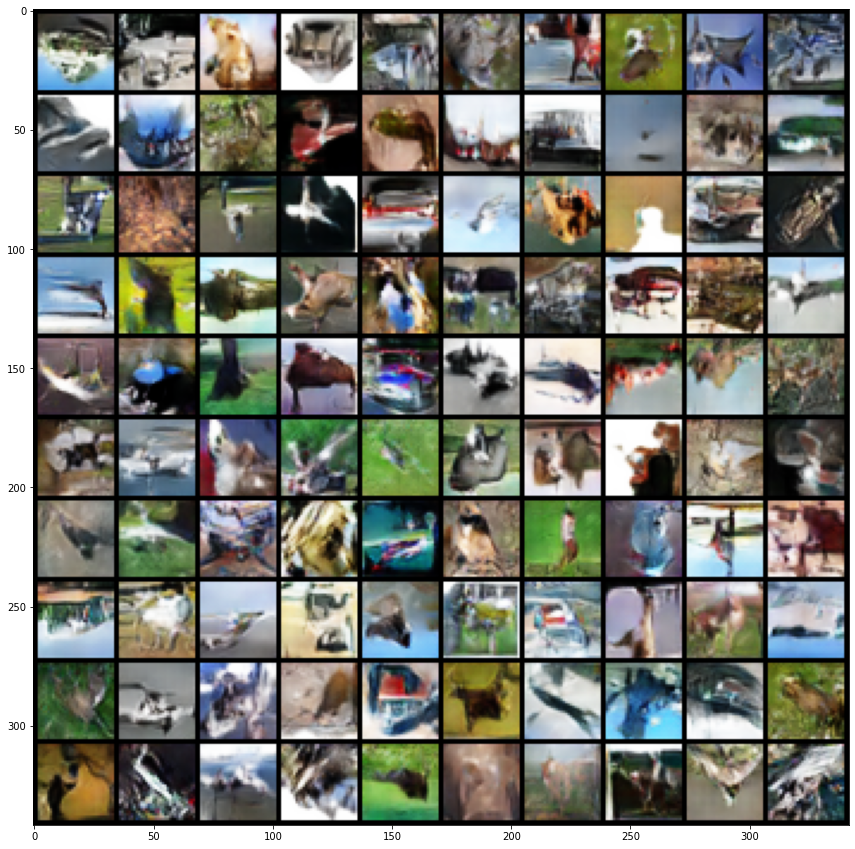

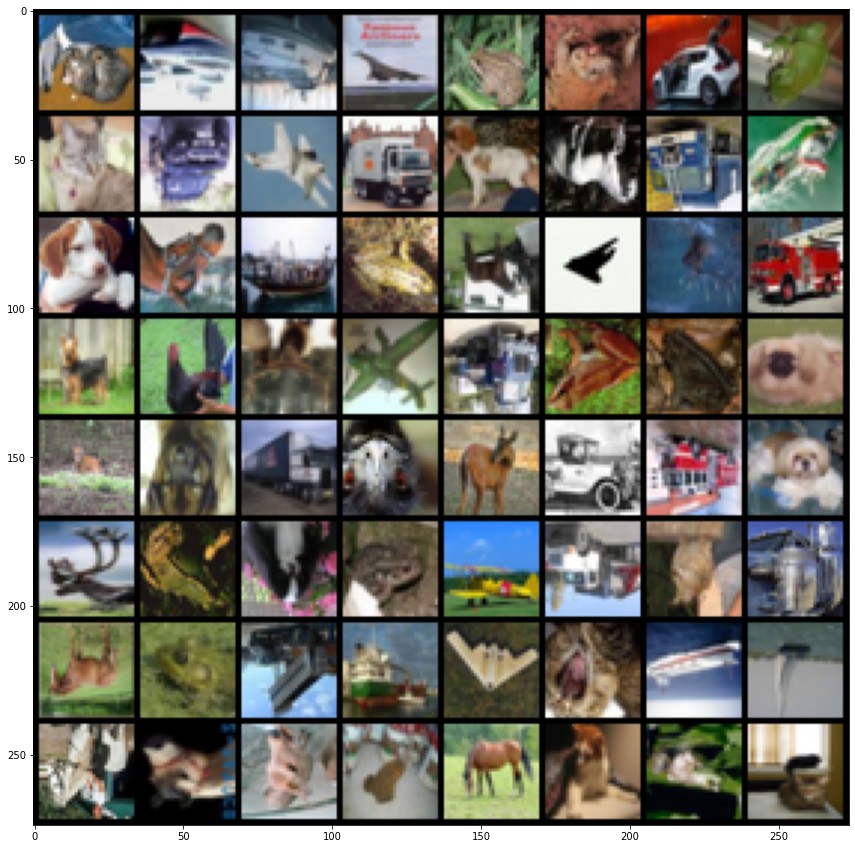

In [225]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    generated = model_G(input_noise).cpu()
    generated = make_grid(
        denorm(generated)[:100], nrow=10, padding=2, normalize=False, range=None, scale_each=False, pad_value=0
    )
    plt.figure(figsize=(15, 15))
    save_image(generated, content_path / "M_GAN/final.png")
    show(generated)

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False, range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15, 15))
show(img)


### Loss Curve


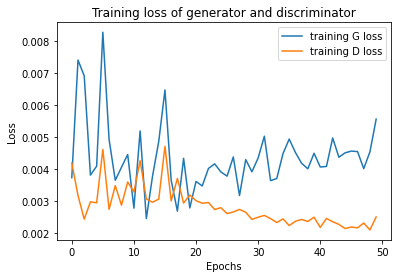

In [226]:
plt.plot(train_losses_G)
plt.plot(train_losses_D)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training loss of generator and discriminator")
plt.legend(["training G loss", "training D loss"])
plt.show()
